### Ordinary least square on New York City (NYC) Airbnb dataset.

In [51]:
from pysal.lib import weights
from pysal.explore import esda
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn
import contextily

# Data Setup

In [52]:
# Setting the data path
path = "/etc/skel/data_pt1/"


In [53]:
# Reading in the data directly from Inside Airbnb
listings = pd.read_csv('http://data.insideairbnb.com/united-states/ny/new-york-city/2023-06-05/data/listings.csv.gz', compression='gzip', header=0, sep=',', quotechar='"')

In [54]:
# Converting it to a GeoPandas DataFrame
listings_gpdf = gpd.GeoDataFrame(
    listings,
    geometry=gpd.points_from_xy(listings['longitude'],
                                   listings['latitude'],
                                   crs="EPSG:4326")
)

# Focusing on attractions in Manhattan, so we need to create a mask to filter locations 
# in the Manhattan borough
boroughs = gpd.read_file(path + "NYC Boroughs/nybb_22a/nybb.shp")
manhattan = boroughs[boroughs['BoroName']=='Manhattan']
manhattan = manhattan.to_crs('EPSG:4326')

listings_mask = listings_gpdf.within(manhattan.loc[3, 'geometry'])

listings_manhattan = listings_gpdf.loc[listings_mask]

In [55]:
print(list(listings_manhattan.columns))

['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availabil

In [56]:
# Subsetting the data to a handful of variables that could be indicative of nightly airbnb price
voi = ['id' # Unique identifier for the listing
       ,'room_type' # Type of room
       ,'accommodates' # The maximum capacity of the listing 
       ,'bedrooms' # The number of bedrooms
       ,'beds' # The number of beds
       ,'review_scores_rating' # The rating
       ,'price' # The nightly rental rate, dependent variable (Y)
      ]

listings_manhattan_subset = listings_manhattan[voi]

## Exploratory Data Analysis & Processing

In [57]:
listings_manhattan_subset.dtypes

id                        int64
room_type                object
accommodates              int64
bedrooms                float64
beds                    float64
review_scores_rating    float64
price                    object
dtype: object

In [58]:
for col in listings_manhattan[['room_type']]:
  print(listings_manhattan_subset[col].unique())

['Entire home/apt' 'Private room' 'Shared room' 'Hotel room']


In [59]:
# Encoding categorical variables

# Room Type, All 0s = hotel room
listings_manhattan_subset['rt_entire_home_apartment'] = np.where(listings_manhattan_subset["room_type"]=='Entire home/apt', 1, 0)
listings_manhattan_subset['rt_private_room'] = np.where(listings_manhattan_subset["room_type"]=='Private room', 1, 0)
listings_manhattan_subset['rt_shared_room'] = np.where(listings_manhattan_subset["room_type"]=='Shared room', 1, 0)

C:\Users\parma\AppData\Local\Temp\ipykernel_2368\1200212701.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\parma\AppData\Local\Temp\ipykernel_2368\1200212701.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\parma\AppData\Local\Temp\ipykernel_2368\1200212701.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

In [60]:
listings_manhattan_subset['price'].values

array(['$240.00', '$120.00', '$315.00', ..., '$63.00', '$662.00',
       '$750.00'], dtype=object)

In [61]:
# Cleaning up the price column
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].str.replace('$', '')
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].str.replace(',', '')
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].astype(float)

# Logging the price variable
listings_manhattan_subset['log_price'] = np.log(listings_manhattan_subset['price'])

C:\Users\parma\AppData\Local\Temp\ipykernel_2368\3974095945.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\parma\AppData\Local\Temp\ipykernel_2368\3974095945.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\parma\AppData\Local\Temp\ipykernel_2368\3974095945.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

In [62]:
# Checking for missingness
print('Total Records:', len(listings_manhattan_subset))
listings_manhattan_subset.isna().sum()

Total Records: 18106


id                             0
room_type                      0
accommodates                   0
bedrooms                    6756
beds                         327
review_scores_rating        5525
price                          0
rt_entire_home_apartment       0
rt_private_room                0
rt_shared_room                 0
log_price                      0
dtype: int64

In [63]:
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['bedrooms'].notna()]
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['review_scores_rating'].notna()]
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['beds'].notna()]
listings_manhattan_subset.isna().sum()

id                          0
room_type                   0
accommodates                0
bedrooms                    0
beds                        0
review_scores_rating        0
price                       0
rt_entire_home_apartment    0
rt_private_room             0
rt_shared_room              0
log_price                   0
dtype: int64

# OLS Regression Analysis

In [64]:
from pysal.model import spreg

In [65]:
# Defining a list of explanatory variables
m_vars = ['accommodates', 'bedrooms','beds','review_scores_rating',
          'rt_entire_home_apartment','rt_private_room','rt_shared_room'
         ]

In [66]:
ols_m = spreg.OLS(
    listings_manhattan_subset[["log_price"]].values # the dependent variable (Y)
    ,listings_manhattan_subset[m_vars].values # the independent variables(Xs)
    ,name_y = 'price',
    name_x = m_vars
)

print(ols_m.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :       price                Number of Observations:        7333
Mean dependent var  :      5.4659                Number of Variables   :           7
S.D. dependent var  :      0.6678                Degrees of Freedom    :        7326
R-squared           :      0.2421
Adjusted R-squared  :      0.2415
Sum squared residual:    2478.021                F-statistic           :    390.1327
Sigma-square        :       0.338                Prob(F-statistic)     :           0
S.E. of regression  :       0.582                Log likelihood        :   -6427.201
Sigma-square ML     :       0.338                Akaike info criterion :   12868.403
S.E of regression ML:      0.5813                Schwarz criterion     :   12916.704

-----------------------------------------------------------------------------

## Exploring unmodeled relationships

In [67]:
# Creating a column to store the model residuals
listings_manhattan_subset["ols_m_r"] = ols_m.u

# Bringing back in the neighborhood variable
listings_manhattan_subset = listings_manhattan_subset.merge(listings_manhattan[['id','neighbourhood_cleansed']], how='left',on='id')

# Get average value of the residual by neighborhood
mean = (
    listings_manhattan_subset.groupby("neighbourhood_cleansed")
    .ols_m_r.mean()
    .to_frame("neighborhood_residual")
)

# Creating a dataframe to store the residuals by neighborhood
residuals_neighborhood = listings_manhattan_subset.merge(
        mean, how="left", left_on="neighbourhood_cleansed", right_index=True
    ).sort_values("neighborhood_residual")

In [68]:
import plotly.express as px
import plotly.io as pio
from IPython.display import HTML

# Plotting the distribution of the residuals in a violin plot
fig = px.violin(residuals_neighborhood, x="neighbourhood_cleansed", y="ols_m_r", color="neighbourhood_cleansed", box=True)
# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Neighborhood", yaxis_title="Residuals"
)
HTML(fig.to_html())

In [69]:
import textwrap

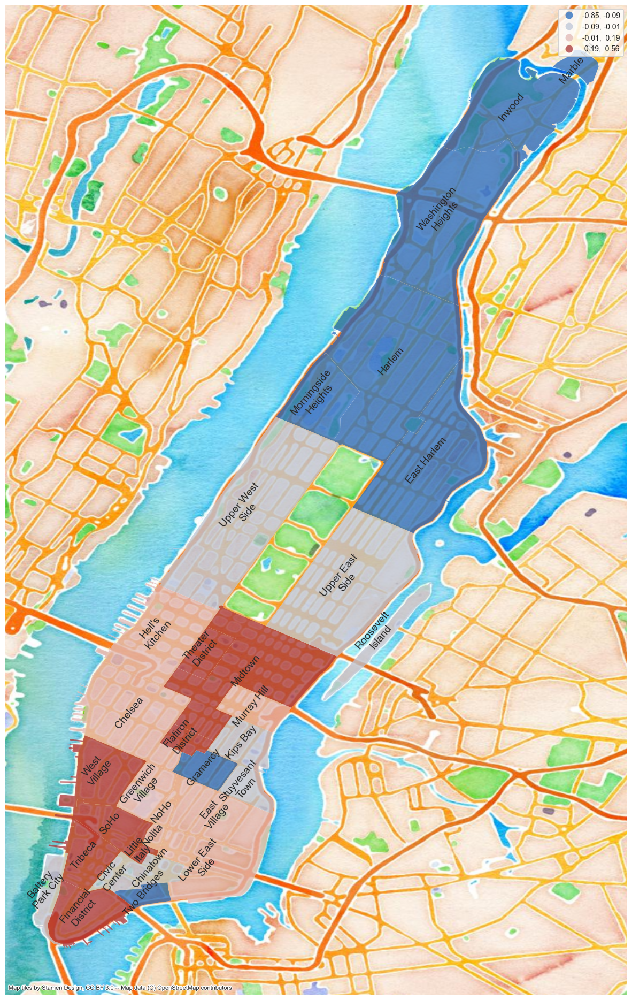

In [70]:
# Producing a map of the average residual by neighborhood
import requests
import geopandas as gpd
from shapely.geometry import shape

# Reading in the NYC Neighborhoods shapefile from data file
import os

nyc_n = gpd.read_file(os.path.join(path,r"NYC Neighborhoods\NYC_Neighborhoods.geojson"), driver='GeoJSON')

# Merging
nyc_n_r = nyc_n.merge(mean, left_on='neighborhood', right_on="neighbourhood_cleansed")

f, ax = plt.subplots(1, figsize=(15, 25))
   
# Plot choropleth of local statistics
nyc_n_r.plot(
    column='neighborhood_residual', 
    cmap='vlag', 
    scheme='quantiles',
    k=4, 
    edgecolor='white', 
    linewidth=0.1, 
    alpha=0.75,
    legend=True,
    ax=ax
)

# Add basemap
contextily.add_basemap(
    ax,
    crs=nyc_n.crs,
    source=contextily.providers.Stamen.Watercolor,
)

for idx, row in nyc_n_r.iterrows():
    txt=row['neighborhood']
    n_txt = '\n'.join(textwrap.wrap(txt, width=11, replace_whitespace=True))
    #print(n_txt)                  
    plt.annotate(text=n_txt, xy=tuple([row.geometry.centroid.x, row.geometry.centroid.y]),
                 horizontalalignment='center',fontsize=14, rotation=50, wrap=True)

    
# Remove axis
ax.set_axis_off()

# Display
plt.show()


In [71]:
# Bringing in the geometry attribute
residuals_neighborhood = residuals_neighborhood.merge(listings_manhattan[['id','geometry']], how='left',on='id')

# Building the spatial weights matrix
knn = weights.KNN.from_dataframe(residuals_neighborhood, k=5)

# Constructing the spatial lag
lag_residual = weights.spatial_lag.lag_spatial(knn, ols_m.u)

# Plotting the results
fig = px.scatter(x=ols_m.u.flatten(), y=lag_residual.flatten(), trendline="ols",
                width=800, height=800)

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="Spatially Lagged Residuals"
)

fig.show()


D:\summer_DSI\dsi_venv\lib\site-packages\libpysal\weights\weights.py:172: UserWarning:

The weights matrix is not fully connected: 
 There are 3 disconnected components.



## Geographically Weighted Regression

GWR models vary from OLS-based models in that instead of fitting a set of global estimates, GWR examines the way in which the relationship between each predictor variable varies across space with respect to the dependent variable. GWR does this by iteratively fitting a localized regression within a search window or neighborhood around each observation. The observation for which the regression is being fit is known as the regression point. Observations that are closer to the regression point are weighted more heavily in the regression than observations that are further away.
Fitting a regression within these local neighborhoods is performed by using either a fixed kernel or an adaptive kernel. A fixed kernel uses an identical search area across all regression points, while an adaptive kernel’s search area can vary across space.

In [72]:
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW

In [73]:
# Encoding categorical variables

# Room Type, All 0s = hotel room
listings_manhattan['rt_entire_home_apartment'] = np.where(listings_manhattan["room_type"]=='Entire home/apt', 1, 0)
listings_manhattan['rt_private_room'] = np.where(listings_manhattan["room_type"]=='Private room', 1, 0)
listings_manhattan['rt_shared_room'] = np.where(listings_manhattan["room_type"]=='Shared room', 1, 0)

# Cleaning up the price column
listings_manhattan['price'] = listings_manhattan['price'].str.replace('$', '')
listings_manhattan['price'] = listings_manhattan['price'].str.replace(',', '')
listings_manhattan['price'] = listings_manhattan['price'].astype(float)

# Logging the price variable
listings_manhattan['log_price'] = np.log(listings_manhattan['price'])

listings_manhattan = listings_manhattan[listings_manhattan['bedrooms'].notna()]
listings_manhattan = listings_manhattan[listings_manhattan['review_scores_rating'].notna()]
listings_manhattan = listings_manhattan[listings_manhattan['beds'].notna()]
listings_manhattan.isna().sum()

listings_manhattan = listings_manhattan[listings_manhattan['bedrooms'].notna()]
listings_manhattan = listings_manhattan[listings_manhattan['review_scores_rating'].notna()]
listings_manhattan = listings_manhattan[listings_manhattan['beds'].notna()]

D:\summer_DSI\dsi_venv\lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

D:\summer_DSI\dsi_venv\lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

D:\summer_DSI\dsi_venv\lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://panda

In [74]:
# Setting the explanatory variables
exp_vars = listings_manhattan[['accommodates', 'bedrooms','beds','review_scores_rating']].values

# Setting the dependent variable: log_price
y = (listings_manhattan['log_price'].values).reshape((-1,1))

# Defining the coordinates of the observations
coords = list(zip(listings_manhattan.geometry.x,listings_manhattan.geometry.y))

In [75]:
# Selecting the optimal bandwidth for the explanatory variables
gwr_selector = Sel_BW(coords, y, exp_vars, spherical=True)
gwr_bw = gwr_selector.search(bw_min=2)

# Displaying the optimal bandwidth
gwr_bw

139.0

In [76]:
# Fit the GWR model to your data
gwr_results = GWR(coords, listings_manhattan[["log_price"]].values, 
                     exp_vars, gwr_bw).fit()

# Print the results of the GWR model
print(gwr_results)

In [77]:
np.float = float
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                7333
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           2541.371
Log-likelihood:                                                   -6519.756
AIC:                                                              13049.512
AICc:                                                             13051.523
BIC:                                                             -62678.855
R2:                                                                   0.223
Adj. R2:                                                              0.222

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [78]:
residuals = gwr_results.resid_response

In [79]:
# Constructing the spatial lag
lag_residual_4 = weights.spatial_lag.lag_spatial(knn, residuals)

# Plotting the results
fig = px.scatter(x=residuals.flatten(), y=lag_residual_4.flatten(), trendline="ols",
                width=800, height=800, title="Residual Plot for GWR Model")

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="MGWR Residuals"
)

fig.show()